# **Analise expploratória**

##Será feito uma análise em cima dos dados na base sleep_cycle_productivity.csv para entender melhor os dados


In [2]:
#Bibliotecas
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [4]:
#Carregando os dados usando a biblioteca do pandas 

data_origin = pd.read_csv(r"Base de Dados\sleep_cycle_productivity.csv")

data_origin.head()

,Date,Person_ID,Age,Gender,Sleep Start Time,Sleep End Time,Total Sleep Hours,Sleep Quality,Exercise (mins/day),Caffeine Intake (mg),Screen Time Before Bed (mins),Work Hours (hrs/day),Productivity Score,Mood Score,Stress Level
0,2024-04-12,1860,32,Other,23.33,4.61,5.28,3,86,87,116,8.808920,8,3,6
1,2024-11-04,1769,41,Female,21.02,2.43,5.41,5,32,21,88,6.329833,10,3,7
2,2024-08-31,2528,20,Male,22.10,3.45,5.35,7,17,88,59,8.506306,10,9,10
3,2024-02-22,8041,37,Other,23.10,6.65,7.55,8,46,34,80,6.070240,8,4,2
4,2024-02-23,4843,46,Other,21.42,4.17,6.75,10,61,269,94,11.374994,8,7,9


In [ ]:
#Entendendo quantos dados, o tipo de dados e se existem valores faltantes na base


print(data_origin.info())  
print(f"O DataFrame tem {data_origin.shape[0]} linhas e {data_origin.shape[1]} colunas.\n")

#n colunas, contagem de valores e valores nulos
colunas_info = pd.DataFrame({
    'Coluna': data_origin.columns,
    'Quantidade de Valores': data_origin.count(),  # Conta valores não nulos
    'Valores Nulos': data_origin.isnull().sum()  # Conta valores nulos
})

print(colunas_info)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 15 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Date                           5000 non-null   object 
 1   Person_ID                      5000 non-null   int64  
 2   Age                            5000 non-null   int64  
 3   Gender                         5000 non-null   object 
 4   Sleep Start Time               5000 non-null   float64
 5   Sleep End Time                 5000 non-null   float64
 6   Total Sleep Hours              5000 non-null   float64
 7   Sleep Quality                  5000 non-null   int64  
 8   Exercise (mins/day)            5000 non-null   int64  
 9   Caffeine Intake (mg)           5000 non-null   int64  
 10  Screen Time Before Bed (mins)  5000 non-null   int64  
 11  Work Hours (hrs/day)           5000 non-null   float64
 12  Productivity Score             5000 non-null   i

In [11]:
#Começando a análise com um resumo descritivo 
data_origin.describe()


,Person_ID,Age,Sleep Start Time,Sleep End Time,Total Sleep Hours,Sleep Quality,Exercise (mins/day),Caffeine Intake (mg),Screen Time Before Bed (mins),Work Hours (hrs/day),Productivity Score,Mood Score,Stress Level
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,5527.152200,38.590600,22.005350,4.980262,6.974902,5.520800,43.962600,146.71140,91.421200,7.987873,5.644200,5.370600,5.548000
std,2595.391771,12.302799,1.157591,1.862508,1.454033,2.863845,25.798541,85.83139,52.079123,2.275734,2.872221,2.835783,2.888419
min,1000.000000,18.000000,20.000000,0.560000,4.500000,1.000000,0.000000,0.00000,0.000000,4.000067,1.000000,1.000000,1.000000
25%,3258.000000,28.000000,21.020000,3.660000,5.690000,3.000000,22.000000,73.00000,46.000000,6.032720,3.000000,3.000000,3.000000
50%,5603.000000,39.000000,22.020000,4.970000,6.960000,5.000000,44.000000,144.00000,92.000000,7.998295,6.000000,5.000000,6.000000
75%,7749.500000,49.000000,23.000000,6.310000,8.210000,8.000000,66.000000,220.00000,136.000000,9.905024,8.000000,8.000000,8.000000
max,9998.000000,59.000000,23.980000,9.420000,9.500000,10.000000,89.000000,299.00000,179.000000,11.999141,10.000000,10.000000,10.000000


In [12]:
# Contando a frequência de cada categoria
print(data_origin['Gender'].value_counts())

Gender
Male      1718
Female    1675
Other     1607
Name: count, dtype: int64


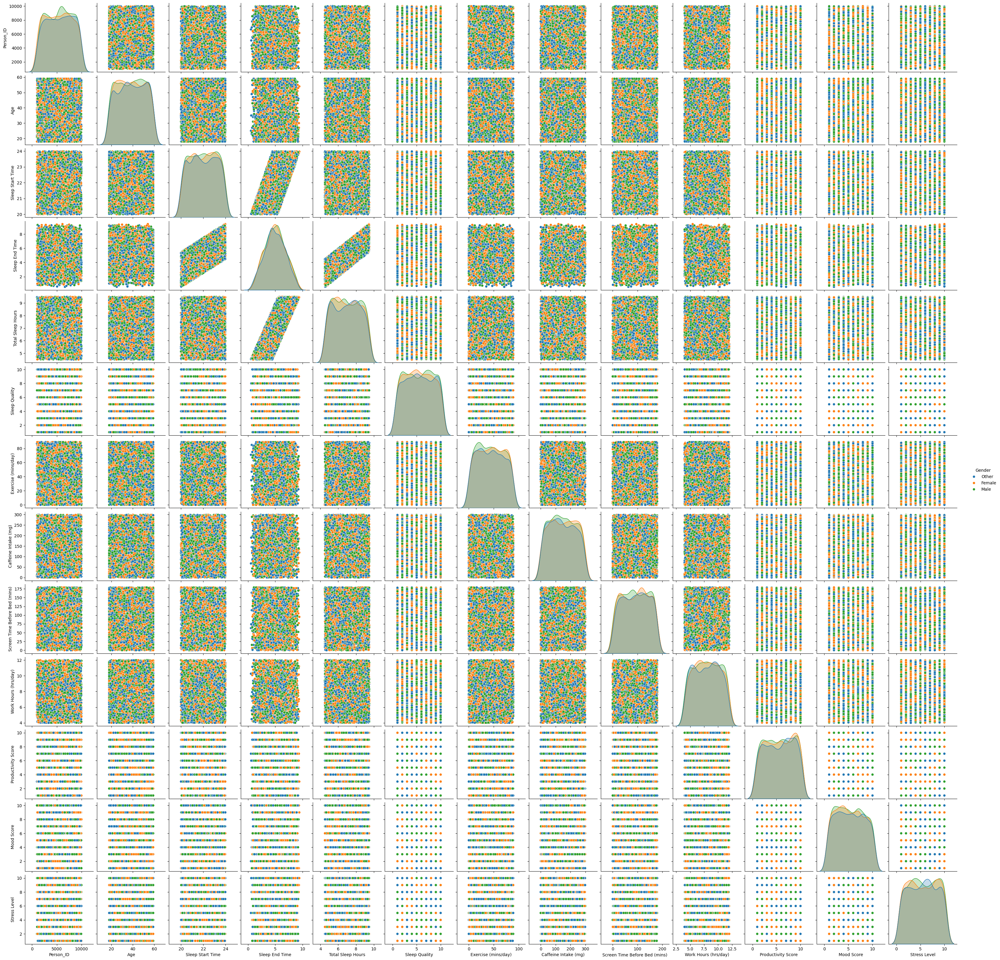

In [15]:
# Usando seaborn para criar um pair plot
sns.pairplot(data_origin, hue='Gender', diag_kind='kde')

plt.show()

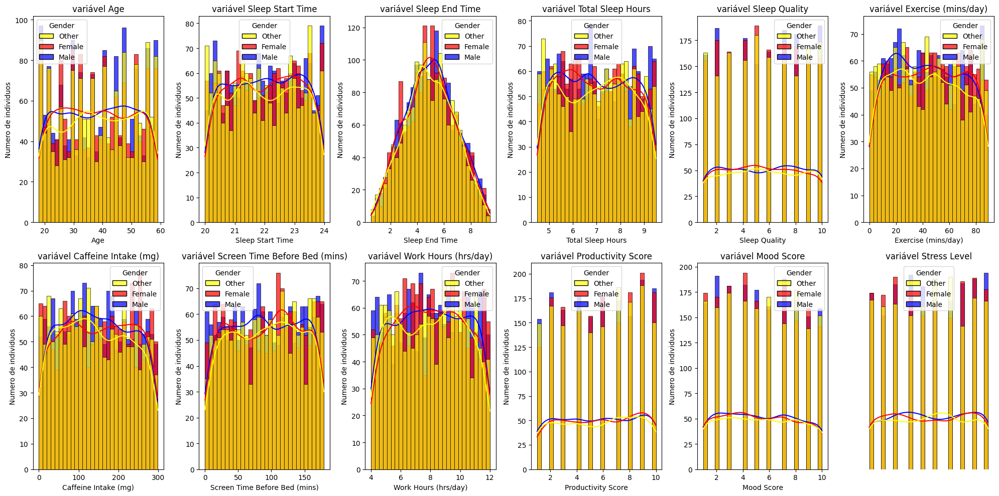

In [11]:
variaveis = [
    'Age',                              
    'Sleep Start Time',               
    'Sleep End Time',                 
    'Total Sleep Hours',              
    'Sleep Quality',                    
    'Exercise (mins/day)',             
    'Caffeine Intake (mg)',            
    'Screen Time Before Bed (mins)',    
    'Work Hours (hrs/day)',           
    'Productivity Score',               
    'Mood Score',                       
    'Stress Level'        
]
# Configurar os subplots
fig, axes = plt.subplots(2, 6, figsize=(20, 10))
axes = axes.flatten()
plt.axis('off')
#Plotar os histogramas com a curva KDE
for i, coluna in enumerate(variaveis):
    sns.histplot(data=data_origin, x=coluna, hue='Gender', kde=True, bins=30, 
                 palette={'Male': 'blue', 'Female': 'red', 'Other': 'yellow'}, alpha=0.7, ax=axes[i])
    axes[i].set_title(f'variável {coluna}')
    axes[i].set_xlabel(coluna)
    axes[i].set_ylabel('Numero de individuos')

plt.tight_layout()
plt.show()




2. Estatísticas Resumidas
Medidas de tendência central e dispersão: df.describe()

Distribuição de valores categóricos: df['coluna'].value_counts()

Skewness e Kurtosis (assimetria e achatamento da distribuição): df.skew(), df.kurtosis()

3. Visualização de Dados
Histogramas: df.hist(bins=30, figsize=(10,5))

Boxplots (para detectar outliers): sns.boxplot(x=df['coluna'])

Gráficos de dispersão: sns.scatterplot(x='coluna1', y='coluna2', data=df)


4. Identificação de Outliers
Método IQR (Intervalo Interquartil):

python
Copiar
Editar
Q1 = df['coluna'].quantile(0.25)
Q3 = df['coluna'].quantile(0.75)
IQR = Q3 - Q1
outliers = df[(df['coluna'] < Q1 - 1.5*IQR) | (df['coluna'] > Q3 + 1.5*IQR)]
Z-Score: from scipy.stats import zscore; df['zscore'] = zscore(df['coluna'])

5. Tratamento de Valores Faltantes
Remover linhas: df.dropna()

Preencher com média/mediana: df.fillna(df['coluna'].mean())

Preencher com valor mais frequente: df.fillna(df['coluna'].mode()[0])

6. Transformações de Dados
Normalização/Escalonamento: from sklearn.preprocessing import StandardScaler

Transformações logarítmicas (se houver viés na distribuição): df['coluna'] = np.log1p(df['coluna'])

Codificação de variáveis categóricas: pd.get_dummies(df['coluna']) ou LabelEncoder()